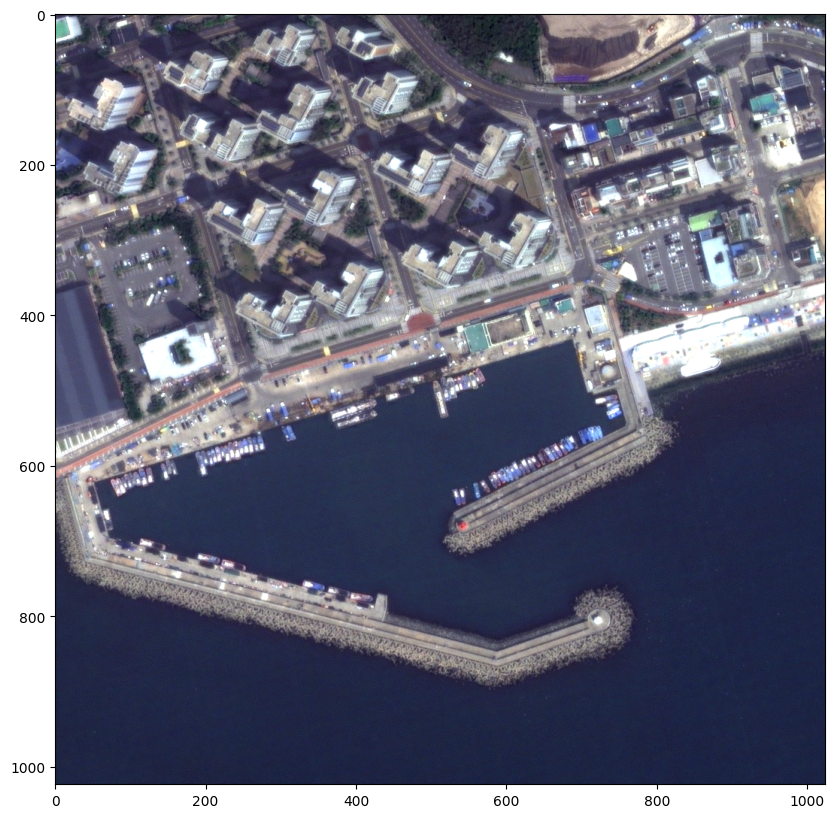

In [1]:
# --- libs
from PIL import Image
from easydict import EasyDict
import os
import json
args = EasyDict()
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt  
Image.MAX_IMAGE_PIXELS = 933120000

# --- head 

args.img_path = "/mnt/hdd/eric/.tmp_ipy/00.Data/AO/0-Pusan-2023-AO/C1_20221227015155_09806_00006119_L1G/0-Pusan-2023-AO_1_C1_20221227015155_09806_00006119_L1G.png"


# Draw image 
img_path = args.img_path
sample_img =  Image.open("/mnt/hdd/eric/.tmp_ipy/15.Lab_Detection/04.Image_Processing/0-Pusan-2023-AO_7_C1_20230515015009_11919_00051985_L1G_PS_5.png")

plt.figure(figsize=(10,10))
plt.imshow(sample_img)


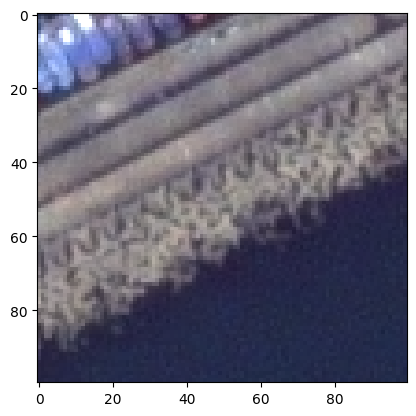

In [2]:
window_position = [100,100,600,600]

# slice
nps = np.asarray(sample_img)

x_shift_start = window_position[2]
x_shift_end   = window_position[2] + window_position[0]

y_shift_start = window_position[3]
y_shift_end  = window_position[3] + window_position[1]

obj = nps[x_shift_start:x_shift_end,y_shift_start:y_shift_end,:]
plt.imshow(obj)

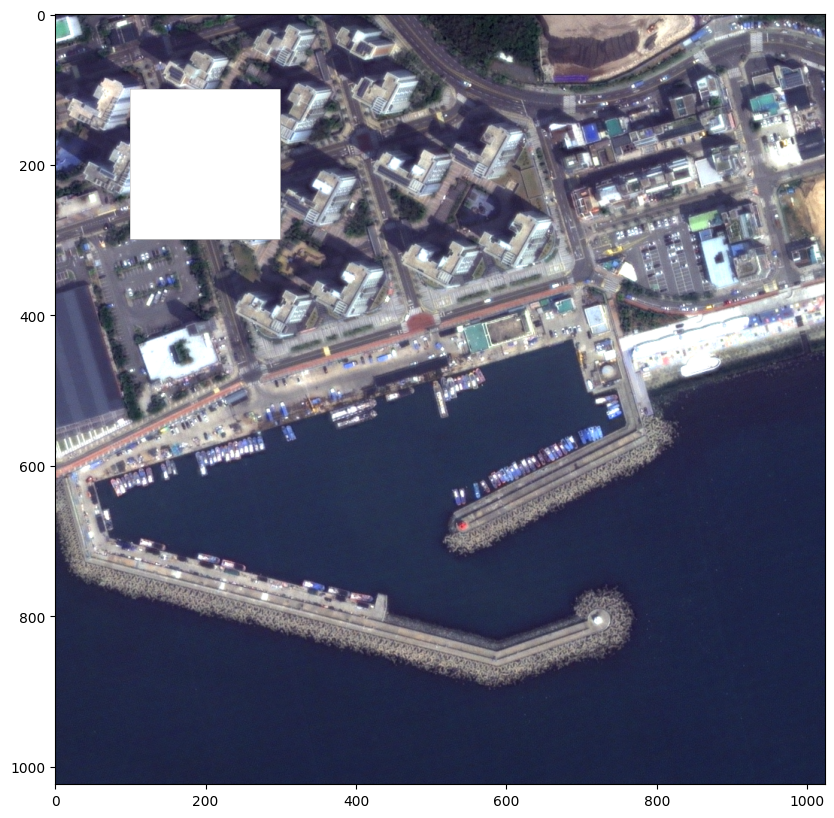

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Load the image using PIL
sample_img = Image.open("/mnt/hdd/eric/.tmp_ipy/15.Lab_Detection/04.Image_Processing/0-Pusan-2023-AO_7_C1_20230515015009_11919_00051985_L1G_PS_5.png")

# Convert PIL image to NumPy array
sample_img_array = np.array(sample_img)

# Define the window position
window_position = [100, 100, 300, 300]

# Set the region defined by window_position to False
x_shift_start = window_position[0]
x_shift_end = window_position[2]
y_shift_start = window_position[1]
y_shift_end = window_position[3]


# Create a mask
mask = np.ones_like(sample_img_array, dtype=bool)
mask[x_shift_start:x_shift_end, y_shift_start:y_shift_end, :] = 0

result = (sample_img_array * mask).clip(0, 255).astype(np.uint8)

# Apply the mask to the original image
#masked_img = np.where(mask, sample_img_array, 0)

# Display the masked image
plt.figure(figsize=(10,10))
plt.imshow(result)
plt.show()


In [4]:
sample_img_array.shape

(1024, 1024, 4)

In [5]:
mask_a = mask.copy()
mask_a[:,:,3] = 0.01  

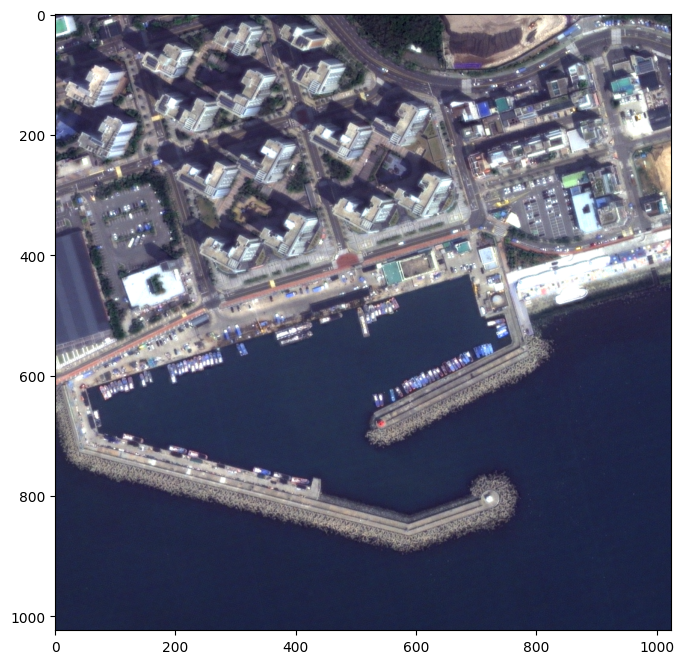

In [6]:
qwe=sample_img_array.copy() 
qwe[:,:,3] = 255
plt.figure(figsize=(8,8))
plt.imshow(qwe)

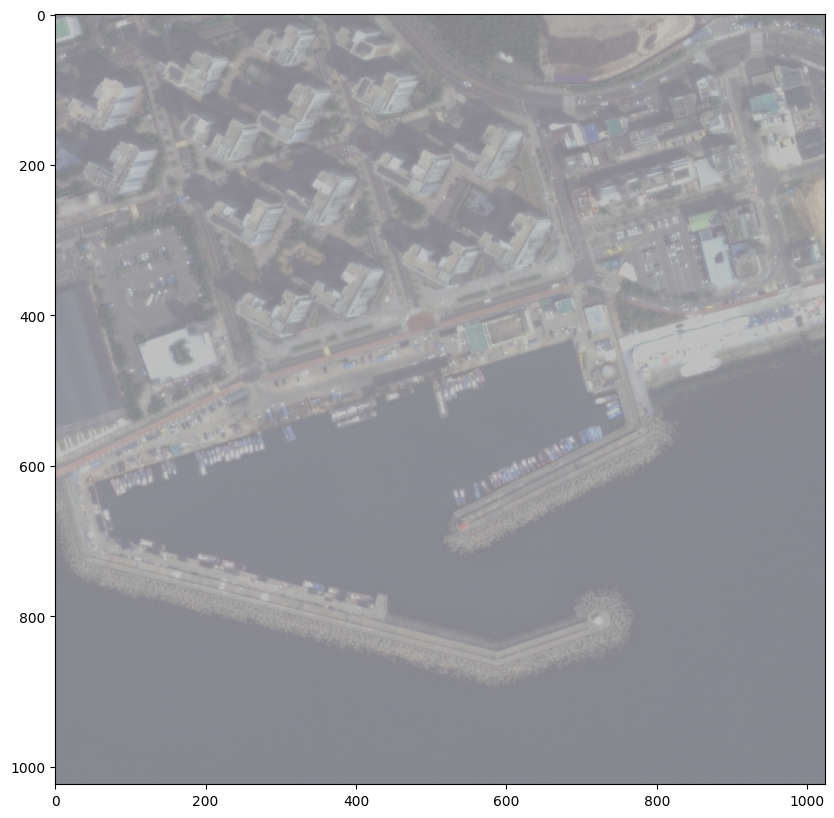

<Figure size 640x480 with 0 Axes>

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Load the image using PIL
sample_img = Image.open("/mnt/hdd/eric/.tmp_ipy/15.Lab_Detection/04.Image_Processing/0-Pusan-2023-AO_7_C1_20230515015009_11919_00051985_L1G_PS_5.png")

# Convert PIL image to NumPy array
sample_img_array = np.array(sample_img)

# Define the factor to darken the image
darken_factor = 0.5  # You can adjust this value as needed, lower values darken the image more

# Darken the image by multiplying the pixel values by the darken_factor
darkened_img = sample_img_array * darken_factor

# Ensure the pixel values remain in the valid range [0, 255]
darkened_img = np.clip(darkened_img, 0, 255).astype(np.uint8)

# Display the darkened image
plt.figure(figsize=(10,10))
plt.imshow(darkened_img)
plt.show()
plt.savefig('resu1.png')

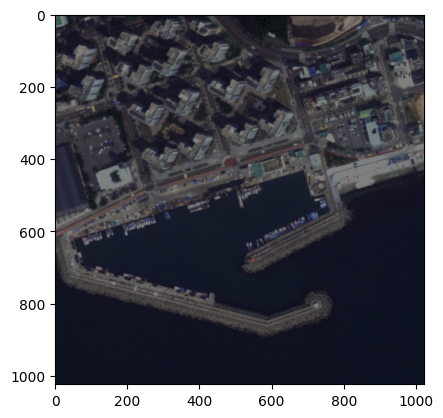

In [8]:
from PIL import Image, ImageEnhance

img = Image.open("/mnt/hdd/eric/.tmp_ipy/15.Lab_Detection/04.Image_Processing/0-Pusan-2023-AO_7_C1_20230515015009_11919_00051985_L1G_PS_5.png")

enhancer = ImageEnhance.Brightness(img)
# to reduce brightness by 50%, use factor 0.5
img = enhancer.enhance(0.5)


plt.imshow(img)
#img.show()
#img.save("image_darker.jpg")

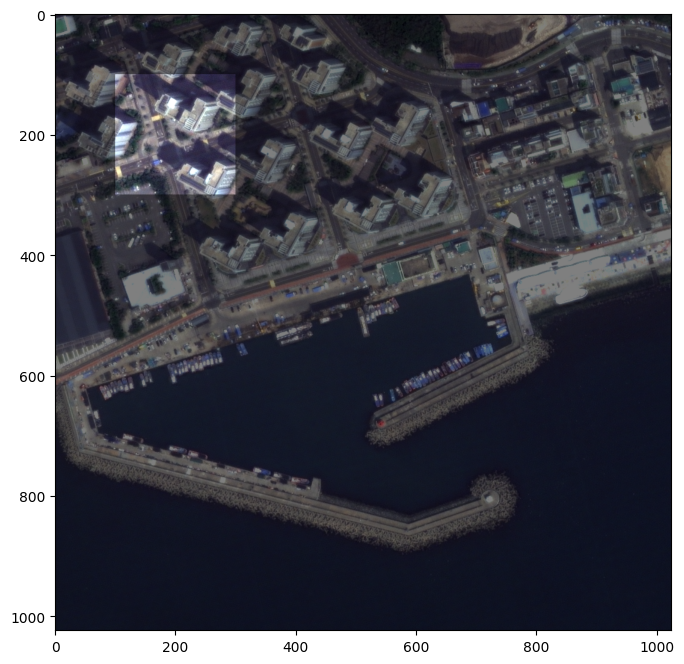

In [9]:
from PIL import Image, ImageEnhance
import numpy as np
import matplotlib.pyplot as plt

# Load the image using PIL
img = Image.open("/mnt/hdd/eric/.tmp_ipy/15.Lab_Detection/04.Image_Processing/0-Pusan-2023-AO_7_C1_20230515015009_11919_00051985_L1G_PS_5.png")

# Convert PIL image to NumPy array
img_array = np.array(img)

# Define the window position
window_position = [100, 100, 300, 300]

# Create a mask for the masked region
mask = np.ones_like(img_array, dtype=bool)

x_shift_start, x_shift_end = window_position[0], window_position[2]
y_shift_start, y_shift_end = window_position[1], window_position[3]
mask[x_shift_start:x_shift_end, y_shift_start:y_shift_end, :] = False

# Convert the mask to uint8 type
mask = mask.astype(np.uint8) * 255



#--------



#-------



# Convert the mask back to PIL Image
mask_img = Image.fromarray(mask)

# Apply the brightness enhancement to the masked region
enhancer = ImageEnhance.Brightness(img)
enhanced_img = enhancer.enhance(0.5)

# Paste the enhanced region onto the original image using the mask
result = Image.composite(enhanced_img, img, mask_img)

# Display the result
plt.figure(figsize=(8,8))
plt.imshow(result)
plt.show()

In [10]:

def get_gaussian_pixels(box,img_size): # [w, h, cw, ch]
    
    w,h,cw,ch = box[0],box[1],box[2],box[3]
    mx = img_size[0]
    my = img_size[1]
    
    r = max(w,h)
    a = cw 
    b = ch
    tmp = []
    for x in range(0,mx):
        for y in range(0,my):
                
            if ( np.square(x - a) + np.square(y - b) ) <= np.square(r) :
                tmp.append([x,y])
                
    return tmp 

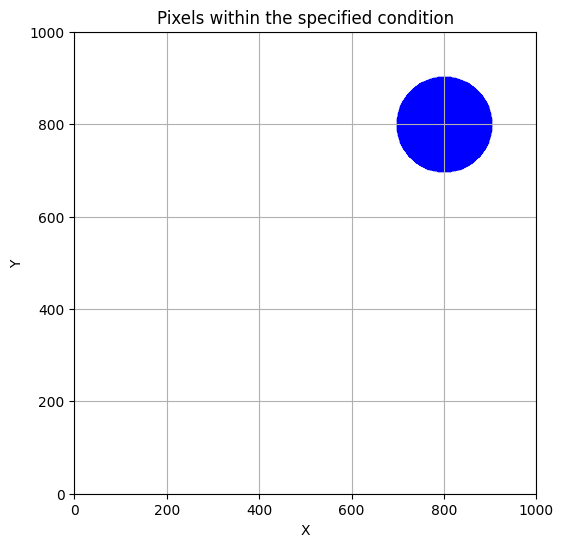

In [11]:
#----
box = [100, 5, 800, 800]
imgshape = (1024,1024)

tmp = get_gaussian_pixels(box, imgshape)


# Convert tmp to a NumPy array for easier manipulation

# Visualize the pixels
plt.figure(figsize=(6, 6))
plt.scatter([i[0] for i in tmp], [i[1] for i in tmp], color='blue', s=2)  # Plotting the pixels
plt.xlim(0, 1000)
plt.ylim(0, 1000)
plt.gca().set_aspect('equal', adjustable='box')  # Ensure aspect ratio is maintained
plt.title('Pixels within the specified condition')
plt.xlabel('X')
plt.ylabel('Y')
plt.grid(True)
plt.show()


In [12]:
# apply circle to mask 

print(np.mean(mask))
for pix in tmp:
    mask[ pix[0], pix[1] ] = False

print(np.mean(mask))

245.27252197265625
237.63231754302979


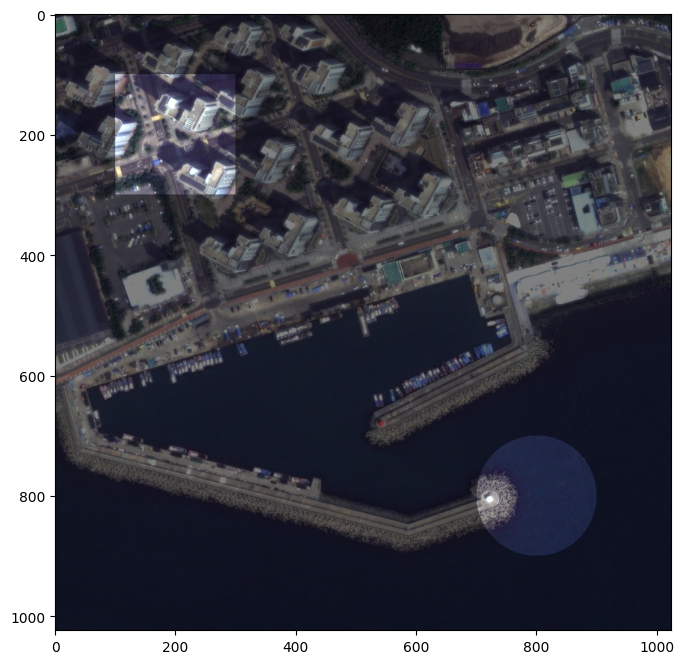

In [13]:
from PIL import Image, ImageEnhance
import numpy as np
import matplotlib.pyplot as plt

# Load the image using PIL
img = Image.open("/mnt/hdd/eric/.tmp_ipy/15.Lab_Detection/04.Image_Processing/0-Pusan-2023-AO_7_C1_20230515015009_11919_00051985_L1G_PS_5.png")

# Convert PIL image to NumPy array
img_array = np.array(img)

# Convert the mask back to PIL Image
mask_img = Image.fromarray(mask)

# Apply the brightness enhancement to the masked region
enhancer = ImageEnhance.Brightness(img)
enhanced_img = enhancer.enhance(0.5)

# Paste the enhanced region onto the original image using the mask
result = Image.composite(enhanced_img, img, mask_img)

# Display the result
plt.figure(figsize=(8,8))
plt.imshow(result)
plt.show()

# Complete Algorithm

In [14]:
def get_gaussian_pixels(box,img_size): # [w, h, cw, ch]
    
    w,h,cw,ch = box[0],box[1],box[2],box[3]
    mx = img_size[0]
    my = img_size[1]
    
    r = max(w,h)
    a = cw 
    b = ch
    tmp = []
    for x in range(0,mx):
        for y in range(0,my):
                
            if ( np.square(x - a) + np.square(y - b) ) <= np.square(r) :
                tmp.append([x,y])
                
    return tmp 

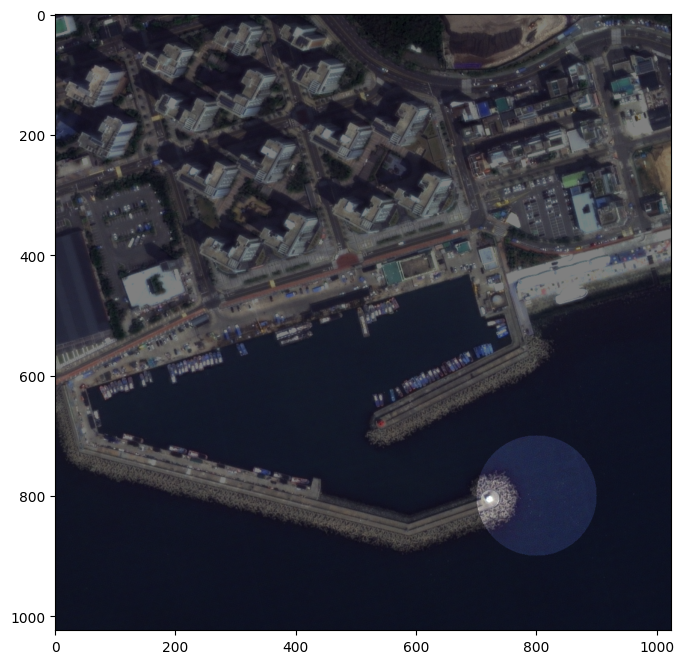

In [15]:
from PIL import Image, ImageEnhance
import numpy as np
import matplotlib.pyplot as plt

# Load the image using PIL
img = Image.open("/mnt/hdd/eric/.tmp_ipy/15.Lab_Detection/04.Image_Processing/0-Pusan-2023-AO_7_C1_20230515015009_11919_00051985_L1G_PS_5.png")
img_array = np.array(img)


#--------------------------------------
# create box 
box = [100, 5, 800, 800]
imgshape = (1024,1024)
tmp = get_gaussian_pixels(box, imgshape)

#--------------------------------------
# create mask 
mask = np.ones_like(img_array, dtype=bool)
mask = mask.astype(np.uint8) * 255

#--------------------------------------
# apply circle to mask 
for pix in tmp:
    mask[ pix[0], pix[1] ] = False
 


mask_img = Image.fromarray(mask)



# Convert the mask back to PIL Image
mask_img = Image.fromarray(mask)

# Apply the brightness enhancement to the masked region
enhancer = ImageEnhance.Brightness(img)
enhanced_img = enhancer.enhance(0.5)

# Paste the enhanced region onto the original image using the mask
result = Image.composite(enhanced_img, img, mask_img)

# Display the result
plt.figure(figsize=(8,8))
plt.imshow(result)
plt.show()

In [16]:
mask_img.size

(1024, 1024)

# Optimizing for Large image

In [43]:
#----- 

from PIL import Image, ImageEnhance
import numpy as np
import matplotlib.pyplot as plt

# Load the image using PIL
img = Image.open("/mnt/hdd/eric/.tmp_ipy/15.Lab_Detection/04.Image_Processing/0-Pusan-2023-AO_7_C1_20230515015009_11919_00051985_L1G_PS_5.png")
img_array = np.array(img)


#--------------------------------------
# create box 
box = [100, 5, 800, 800]
imgshape = (1024,1024)
tmp = get_gaussian_pixels(box, imgshape)

#--------------------------------------
# create mask 
mask = np.ones_like(img_array, dtype=bool)
mask = mask.astype(np.uint8) * 255

In [44]:
img_array.shape

(1024, 1024, 4)

In [47]:
import torch
from einops import rearrange

# Assuming you have an image tensor of shape (batch_size, channels, height, width)
image = torch.randn(1, 3, 256, 256)  # Example image tensor

# Split the image into smaller patches
patch_size = 64  # Define the size of each patch
patches = rearrange(image, 'b c (h p1) (w p2) -> b (h w) c p1 p2', p1=patch_size, p2=patch_size)

# 'b' stands for batch size, 'c' for channels, 'h' for height, 'w' for width
# The output will be of shape (batch_size, num_patches, channels, patch_size, patch_size)

# Example usage: Print the shape of the patches tensor
print(patches.shape)


torch.Size([1, 16, 3, 64, 64])


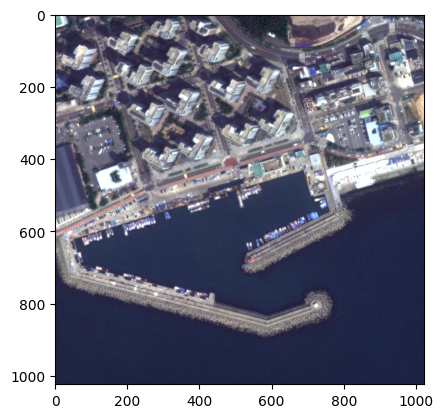

In [61]:
plt.imshow(img_array)

In [62]:
from einops import rearrange, reduce, repeat

window_size = img_array.shape[0] // 2

patches = rearrange(img_array, '(p1 h) (p2 w) c -> c (h w) p1 p2 ' ,p1 = window_size, p2=window_size) 

In [64]:
patches.shape

(4, 4, 512, 512)

In [67]:
part_1 = patches[:,0,:,:]

In [70]:
part_1 = rearrange(part_1, 'c h w -> h w c')

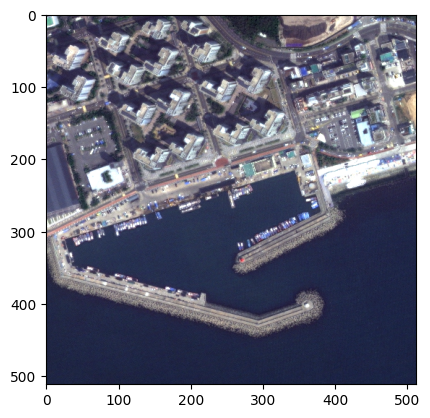

In [72]:
plt.imshow(part_1)

In [55]:
patches_reshape = rearrange(patches, 'c h w p1 p2 -> h w p1 p2 c')

In [56]:
patches_reshape.shape

(2, 2, 512, 512, 4)

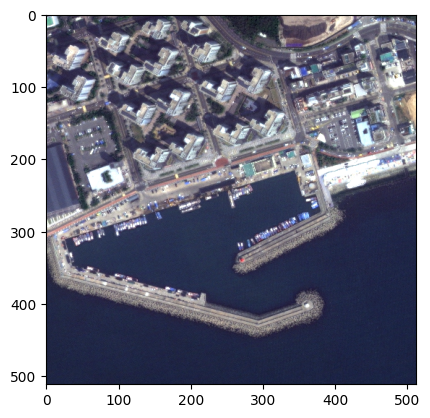

In [58]:
plt.imshow( patches_reshape[0,0,:,:,:] )

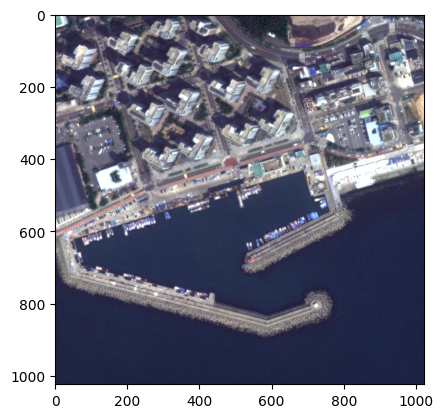

In [73]:
plt.imshow(img_array)

In [91]:
from einops import rearrange

# Assuming img_array is your image array
# You should specify the window size based on the dimensions of your image
window_size_h = img_array.shape[0] // 2
window_size_w = img_array.shape[1] // 2

# Split the image into patches without resizing
patches = rearrange(img_array, '(h1 p1) (w1 p2) c -> (h1 w1) p1 p2 c', p1=window_size_h, p2=window_size_w)

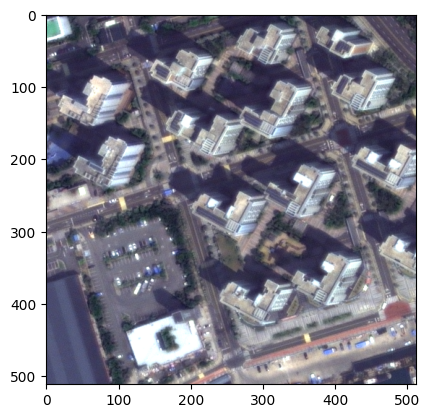

In [92]:
plt.imshow( patches[0] ) 

In [120]:
patches.shape

(4, 512, 512, 4)

In [122]:
tmp[0][0]

700

In [96]:
#--------------------------------------
# create mask 
mask = np.ones_like(img_array, dtype=bool)
mask = mask.astype(np.uint8) * 255

#--------------------------------------
# apply circle to mask 
for pix in tmp:
    mask[ pix[0], pix[1] ] = False
 
#mask_img = Image.fromarray(mask)
mask_img = mask

In [97]:
patches_mask = rearrange(mask_img, '(h1 p1) (w1 p2) c -> (h1 w1) p1 p2 c', p1=window_size_h, p2=window_size_w)

In [100]:
patches_mask.shape

(4, 512, 512, 4)

In [111]:
patches_mask.shape

(4, 512, 512, 4)

In [113]:
all_patches = []


def enchan_(img, mask):
    # Convert the mask back to PIL Image
    img = Image.fromarray(img)
    mask_img = Image.fromarray(mask)
    
    # Apply the brightness enhancement to the masked region
    enhancer = ImageEnhance.Brightness(img)
    enhanced_img = enhancer.enhance(0.5)

    # Paste the enhanced region onto the original image using the mask
    result = Image.composite(enhanced_img, img, mask_img)
    return result

#--------------------------
for i in range((img_array.shape[0] // window_size_h) ** 2):
    
    #patches = Image.fromarray(patches)
    
    t1 = patches[i]
    t2 = patches_mask[i]
    print(t1.shape)
    print(t2.shape)
    a= enchan_(t1,t2)
    
    all_patches.append(a) 


(512, 512, 4)
(512, 512, 4)
(512, 512, 4)
(512, 512, 4)
(512, 512, 4)
(512, 512, 4)
(512, 512, 4)
(512, 512, 4)


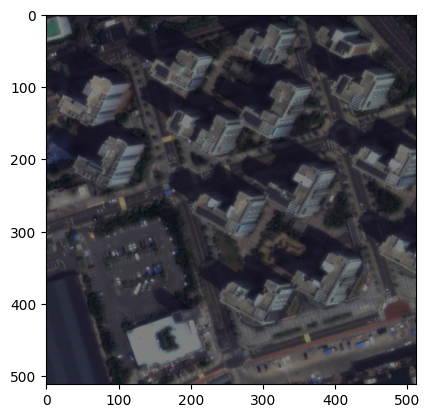

In [116]:
plt.imshow( all_patches[0] )

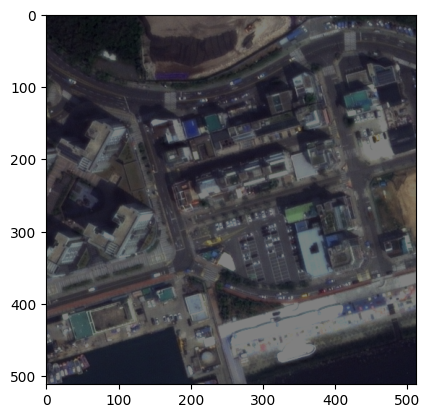

In [117]:
plt.imshow( all_patches[1] )

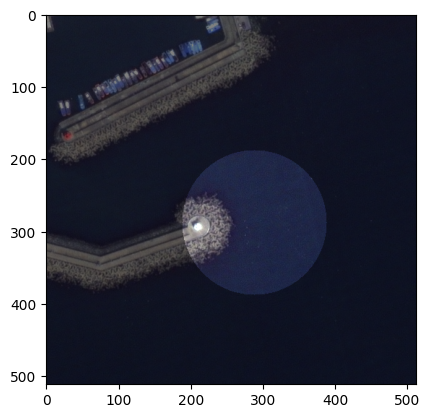

In [119]:
plt.imshow( all_patches[3] )